<a href="https://colab.research.google.com/github/briwu/autofocus_tool/blob/main/442_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Algortithm
1. align the images in stack
2. blur all images in stack
3. create gradient map with different filters (laplacian, sobel, etc.)
4. for each coordinate in each aligned image in stack, choose pixel with largest gradient

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
print(cv2.__version__)
import random
from google.colab.patches import cv2_imshow

! wget -O img1.jpg "https://drive.google.com/uc?export=download&id=1omMydL6ADxq_vW5gl_1EFhdzT9kaMhUt"
! wget -O img2.jpg "https://drive.google.com/uc?export=download&id=12lxB1ArAlwGn97XgBgt-SFyjE7udMGvf"

img1 = plt.imread('img1.jpg')
img2 = plt.imread('img2.jpg')

def plot_imgs(img1, img2):
  fig, ax = plt.subplots(1, 2, figsize=(15, 20))
  for a in ax:
    a.set_axis_off()
  ax[0].imshow(img1)
  ax[1].imshow(img2)

In [2]:
def match_keypoints(desc_1, desc_2, ratio=.8):
  matcher = cv2.BFMatcher(cv2.NORM_HAMMING)
  # initial_matches = matcher.knnMatch(desc_1, desc_2, k=2)
  initial_matches = matcher.match(desc_1, desc_2)
  matches = sorted(initial_matches, key=lambda x: x.distance)[0:100]
  # matches = []
  # for i, j in initial_matches:
  #   if i.distance < ratio * j.distance:
  #     matches.append(i)
  return matches


def align_images(images, debug=False, SIFT=False):
  # first_im = cv2.cvtColor(images[0], cv2.COLOR_BGR2GRAY)
  first_im = images[0]
  aligned = [images[0]] # keep first image as grayscale reference image
  if SIFT and cv2.__version__ <= "3.4.2": # Able to use SIFT with openCV version 3.4.2 or earlier
    print("USING SIFT")
    detector = cv2.xfeatures2d.SIFT_create()
  detector = cv2.ORB_create(1000)
  first_keyp, first_desc = detector.detectAndCompute(first_im, None)

  for im in images[1:]:
    # im_bw = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    im_keyp, im_desc = detector.detectAndCompute(im, None) #orb features for image im
    matches = match_keypoints(first_desc, im_desc)
    img1_arr, img2_arr = [], []
    for m in matches:
      img1_arr.append(list(first_keyp[m.queryIdx].pt))
      img2_arr.append(list(im_keyp[m.trainIdx].pt))
    img1_arr = np.array(img1_arr, int)
    img2_arr = np.array(img2_arr, int)
    H, mask = cv2.findHomography(img2_arr, img1_arr, cv2.RANSAC, ransacReprojThreshold=2.0)

    aligned.append(cv2.warpPerspective(im, H, (first_im.shape[1], first_im.shape[0]), flags=cv2.INTER_LINEAR))

    if debug:
      match_plot = cv2.drawMatches(first_im, first_keyp, im, im_keyp, matches[:20], None, flags=2)
      cv2_imshow(match_plot)
  return aligned

In [ ]:
!pip install Cmake
!pip uninstall opencv-python
!pip install -q opencv-python==3.4.0.14
import cv2

print(cv2.__version__)

In [ ]:
def align_images(images, debug=False):
        """Align the images.  Changing the focus on a lens, even if the camera remains fixed,
         causes a mild zooming on the images. We need to correct the images so they line up perfectly on top
        of each other.

        Args:
            images: list of image data
        """

        def _find_homography(
            _img1_key_points, _image_2_kp, _matches
        ):
            image_1_points = np.zeros((len(_matches), 1, 2), dtype=np.float32)
            image_2_points = np.zeros((len(_matches), 1, 2), dtype=np.float32)

            for j in range(0, len(_matches)):
                image_1_points[j] = _img1_key_points[_matches[j].queryIdx].pt
                image_2_points[j] = _image_2_kp[_matches[j].trainIdx].pt

            homography, mask = cv2.findHomography(
                image_1_points, image_2_points, cv2.RANSAC, ransacReprojThreshold=2.0
            )

            return homography

        aligned_imgs = []

        detector = cv2.ORB_create(1000)

        # Assume that image 0 is the "base" image and align all the following images to it
        aligned_imgs.append(images[0])
        img0_gray = cv2.cvtColor(images[0], cv2.COLOR_BGR2GRAY)
        img1_key_points, image1_desc = detector.detectAndCompute(img0_gray, None)

        for i in range(1, len(images)):
            img_i_key_points, image_i_desc = detector.detectAndCompute(images[i], None)

            bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
            raw_matches = bf.match(image_i_desc, image1_desc)

            sort_matches = sorted(raw_matches, key=lambda x: x.distance)
            matches = sort_matches[0:128]

            homography_matrix = _find_homography(
                img_i_key_points, img1_key_points, matches
            )
            aligned_img = cv2.warpPerspective(
                images[i],
                homography_matrix,
                (images[i].shape[1], images[i].shape[0]),
                flags=cv2.INTER_LINEAR,
            )

            aligned_imgs.append(aligned_img)

            if debug:
              match_plot = cv2.drawMatches(images[0], img1_key_points, images[i], img_i_key_points, matches[:20], None, flags=2)
              cv2_imshow(match_plot)


        return aligned_imgs

In [ ]:
def doLap(image, gaussian_blur=True):

    # YOU SHOULD TUNE THESE VALUES TO SUIT YOUR NEEDS
    kernel_size = 3        # Size of the laplacian window
    blur_size = 3           # How big of a kernal to use for the gaussian blur
                            # Generally, keeping these two values the same or very close works well
                            # Also, odd numbers, please...
    blurred = None

    if gaussian_blur:
      blurred = cv2.GaussianBlur(image, (blur_size,blur_size), 0)
    else:
      blurred = cv2.medianBlur(image, blur_size)
    return cv2.Laplacian(blurred, cv2.CV_64F, ksize=kernel_size)

def compute_laplacian(images, kernel_size=5, lap_kernel_size=5):

  res = []

  for im in images:
    im_grayscale = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    im_blur = cv2.GaussianBlur(im_grayscale, (kernel_size, kernel_size), 0)
    lap = cv2.Laplacian(im_blur, cv2.CV_64F, ksize=lap_kernel_size)

    res.append(lap)
  res = np.asarray(res)

  return res

In [ ]:
def focus_stack(images):
    images = align_images(images)

    print("Computing the laplacian of the blurred images")
    laps = []
    for i in range(len(images)):
        print("Lap {}".format(i))
        laps.append(doLap(cv2.cvtColor(images[i],cv2.COLOR_BGR2GRAY)))

    laps = np.asarray(laps)
    print("Shape of array of laplacians = {}".format(laps.shape))

    output = np.zeros(shape=images[0].shape, dtype=images[0].dtype)

    abs_laps = np.absolute(laps)
    # idxs = abs_laps.argmax(axis=0)
    # for i in range(0, images[0].shape[0]):
    #   for j in range(0, images[0].shape[1]):
    #     idx = idxs[i, j]
    #     # print(idx)
    #     output[i, j] = images[idx][i, j]
    maxima = abs_laps.max(axis=0)
    bool_mask = abs_laps == maxima
    mask = bool_mask.astype(np.uint8)
    for i in range(0,len(images)):
        output = cv2.bitwise_not(images[i],output, mask=mask[i])
    # return output
    return 255-output

def focus_stack2(images):
  images = align_images(images)
  laplacian = compute_laplacian(images)

  output = np.zeros(shape=images[0].shape, dtype=images[0].dtype)
  laplacian_abs = np.absolute(laplacian)
  m = laplacian_abs.max(axis=0)
  bool_mask = np.array(laplacian_abs == m)
  mask = bool_mask.astype(np.uint8)

  for i, im in enumerate(images):
    output = cv2.bitwise_not(im, output, mask=mask[i])

  return 255 - output

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
image_files = ['/content/drive/MyDrive/442images/bottles_1.jpg', '/content/drive/MyDrive/442images/bottles_2.jpg']
image_files2 = ['/content/drive/MyDrive/442images/knife_1.jpg', '/content/drive/MyDrive/442images/knife_2.jpg', '/content/drive/MyDrive/442images/knife_3.jpg', '/content/drive/MyDrive/442images/knife_4.jpg',]

# merged = focus_stack2(focusimages)
# cv2_imshow(merged)
image_matrices = [cv2.imread(img) for img in image_files]
image_matrices2 = [cv2.imread(img) for img in image_files2]
# merged = _focus_stack(['/content/drive/MyDrive/442images/bottles_1.jpg', '/content/drive/MyDrive/442images/bottles_2.jpg'], custom=True)
merged2 = focus_stack(image_matrices)
merged3 = focus_stack(image_matrices2)
cv2_imshow(merged2)
cv2_imshow(merged3)

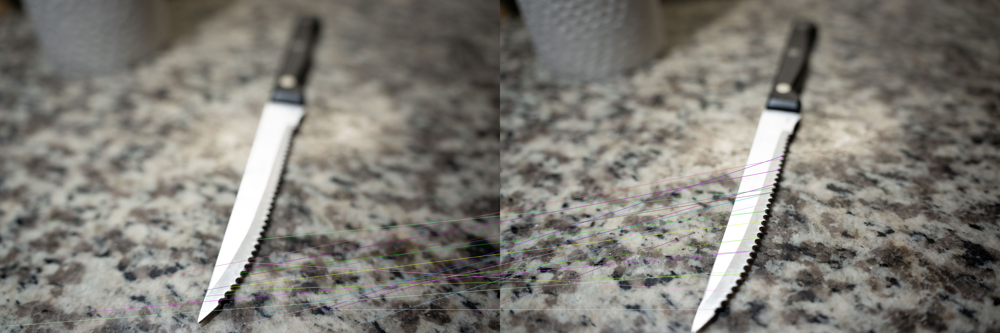

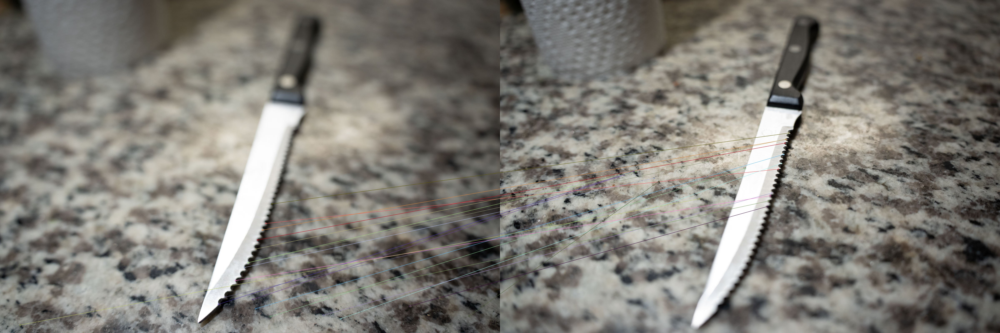

[array([[[ 23,  39,  52],
         [ 23,  39,  52],
         [ 23,  39,  52],
         ...,
         [ 46,  55,  59],
         [ 45,  54,  58],
         [ 45,  54,  58]],
 
        [[ 23,  39,  52],
         [ 23,  39,  52],
         [ 23,  39,  52],
         ...,
         [ 46,  55,  59],
         [ 45,  54,  58],
         [ 45,  54,  58]],
 
        [[ 24,  40,  53],
         [ 24,  40,  53],
         [ 23,  39,  52],
         ...,
         [ 46,  55,  59],
         [ 45,  54,  58],
         [ 45,  54,  58]],
 
        ...,
 
        [[115, 119, 113],
         [119, 123, 117],
         [126, 128, 122],
         ...,
         [ 71,  75,  76],
         [ 71,  75,  76],
         [ 71,  75,  76]],
 
        [[121, 128, 121],
         [127, 131, 125],
         [130, 134, 128],
         ...,
         [ 76,  78,  79],
         [ 75,  77,  78],
         [ 75,  77,  78]],
 
        [[119, 126, 119],
         [121, 128, 121],
         [122, 126, 120],
         ...,
         [ 79,  81,  82],
  

In [ ]:
images = []
for i in range(1, 4):
  images.append(cv2.imread(f'/content/drive/MyDrive/442images/knife_{i}.jpg'))

align_images(images, debug=True)

In [ ]:
def display_images(img_set, count):
    images = []
    for i in range(1, count):
      images.append(plt.imread(f'/content/drive/MyDrive/442images/{img_set}_{i}.jpg'))
    merged = focus_stack2(images)
    cv2_imshow(merged)

display_images("ketchup", 5)